<a href="https://colab.research.google.com/github/KeertiJoshi-9/Zee-Recommendation-System/blob/main/ZEE_data_business_case_study.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Zee Recommender Systems: Personalized Movie Recommendations

###Dataset Explanation:

The dataset for this project is composed of three primary files, each contributing essential information for building the recommender system:

1. Ratings File (ratings.dat):
- Format: UserID::MovieID::Rating::Timestamp
- Contains user ratings for movies on a 5-star scale.
- Includes a timestamp representing when the rating was given.
- Each user has rated at least 20 movies.

2. Users File (users.dat):
- Format: UserID::Gender::Age::Occupation::Zip-code
- Provides demographic information about the users, including gender, age
group, occupation, and zip code.
- Demographic data is voluntarily provided by users and varies in accuracy
and completeness.

3. Movies File (movies.dat):
- Format: MovieID::Title::Genres
- Lists movie titles alongside their respective genres.
- Genres are categorized into multiple types like Action, Comedy, Drama,
etc., and are pipe-separated.

###Key Points to Note:

1. UserID and MovieID serve as unique identifiers for users and movies,
respectively.
2. Ratings reflect user preferences and are crucial for understanding individual and
collective tastes.
3. User Demographics (gender, age, occupation) can provide insights into user
preferences and behavior patterns.
4. Movie Details (title, genres) are essential for categorizing movies and
understanding their appeal to different user segments.

###What is Expected?
Assuming you're a data scientist at Zee, your responsibility involves creating a
personalized movie recommender system.

Our primary goals are:

- To analyze user ratings, demographic data, and movie characteristics to
understand viewing preferences.
- To apply collaborative filtering, Pearson Correlation, Cosine Similarity, and Matrix Factorization techniques to build an effective recommender system.
- To evaluate the system's performance and refine it for accuracy and user
relevance.

In [35]:
#Importing libraries

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from scipy import sparse
from scipy.stats import pearsonr

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors

import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error

In [36]:
warnings.simplefilter('ignore')
pd.set_option("display.max_columns", None)
pd.options.display.float_format = '{:.2f}'.format
sns.set_style('white')

In [37]:
movies = pd.read_fwf('zee-movies.dat',encoding='ISO-8859-1')
ratings = pd.read_fwf('zee-ratings.dat',encoding='ISO-8859-1')
users = pd.read_fwf('zee-users.dat',encoding='ISO-8859-1')

In [38]:
print("Shape of the Movies dataset: ", movies.shape)
print("Shape of the Ratings dataset: ", ratings.shape)
print("Shape of the Users dataset: ", users.shape)

Shape of the Movies dataset:  (3883, 3)
Shape of the Ratings dataset:  (1000209, 1)
Shape of the Users dataset:  (6040, 1)


In [39]:
movies.head()

,Movie ID::Title::Genres,Unnamed: 1,Unnamed: 2
0,1::Toy Story (1995)::Animation|Children's|Comedy,NaN,NaN
1,2::Jumanji (1995)::Adventure|Children's|Fantasy,NaN,NaN
2,3::Grumpier Old Men (1995)::Comedy|Romance,NaN,NaN
3,4::Waiting to Exhale (1995)::Comedy|Drama,NaN,NaN
4,5::Father of the Bride Part II (1995)::Comedy,NaN,NaN


In [40]:
ratings.head()

,UserID::MovieID::Rating::Timestamp
0,1::1193::5::978300760
1,1::661::3::978302109
2,1::914::3::978301968
3,1::3408::4::978300275
4,1::2355::5::978824291


In [41]:
users.head()

,UserID::Gender::Age::Occupation::Zip-code
0,1::F::1::10::48067
1,2::M::56::16::70072
2,3::M::25::15::55117
3,4::M::45::7::02460
4,5::M::25::20::55455


In [42]:
#Read Data and Data Formatting:
#MOVIES:

movies.drop(columns=['Unnamed: 1', 'Unnamed: 2'], inplace=True)

delimiter = '::'
movies = movies['Movie ID::Title::Genres'].str.split(delimiter, expand=True)
movies.columns = ['Movie ID', 'Title', 'Genres']

movies.rename(columns={'Movie ID':'MovieID'}, inplace=True)
movies1=movies.copy()
movies.head()

,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy


In [43]:
#Read Data and Data Formatting:
#RATINGS:

ratings = ratings['UserID::MovieID::Rating::Timestamp'].str.split(delimiter, expand=True)
ratings.columns = ['UserID', 'MovieID', 'Rating', 'Timestamp']

ratings1=ratings.copy()
ratings.head()

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


In [44]:
#Read Data and Data Formatting:
#USERS:

users = users['UserID::Gender::Age::Occupation::Zip-code'].str.split(delimiter, expand=True)
users.columns = ['UserID', 'Gender', 'Age', 'Occupation', 'ZipCode']
users1=users.copy()
users.head()

,UserID,Gender,Age,Occupation,ZipCode
0,1,F,1,10,48067
1,2,M,56,16,70072
2,3,M,25,15,55117
3,4,M,45,7,02460
4,5,M,25,20,55455


In [45]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6040 entries, 0 to 6039
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   UserID      6040 non-null   object
 1   Gender      6040 non-null   object
 2   Age         6040 non-null   object
 3   Occupation  6040 non-null   object
 4   ZipCode     6040 non-null   object
dtypes: object(5)
memory usage: 236.1+ KB


In [46]:
users.describe()

,UserID,Gender,Age,Occupation,ZipCode
count,6040,6040,6040,6040,6040
unique,6040,2,7,21,3439
top,1,M,25,4,48104
freq,1,4331,2096,759,19


In [47]:
users['Age'].value_counts()

,count
Age,
25,2096
35,1193
18,1103
45,550
50,496
56,380
1,222


In [48]:
users.replace({'Age':{'1':  "Under 18",
                      '18':  "18-24",
                      '25':  "25-34",
                      '35':  "35-44",
                      '45':  "45-49",
                      '50':  "50-55",
                      '56':  "56 and above"}}, inplace=True)

In [49]:
users['Occupation'].value_counts()

,count
Occupation,
4,759
0,711
7,679
1,528
17,502
12,388
14,302
20,281
2,267


In [50]:
users.replace({'Occupation':{'0': "other",
                             '1': "academic/educator",
                             '2': "artist",
                             '3': "clerical/admin",
                             '4': "college/grad student",
                             '5': "customer service",
                             '6': "doctor/health care",
                             '7': "executive/managerial",
                             '8': "farmer",
                             '9': "homemaker",
                             '10': "k-12 student",
                             '11': "lawyer",
                             '12': "programmer",
                             '13': "retired",
                             '14': "sales/marketing",
                             '15': "scientist",
                             '16': "self-employed",
                             '17': "technician/engineer",
                             '18': "tradesman/craftsman",
                             '19': "unemployed",
                             '20': "writer"}}, inplace=True)

In [51]:
users.head()

,UserID,Gender,Age,Occupation,ZipCode
0,1,F,Under 18,k-12 student,48067
1,2,M,56 and above,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


###Exploratory Data Analysis

In [52]:
# Extracting the year between parentheses
movies['Year'] = movies['Title'].str.extract(r'\((\d{4})\)', expand=False)

# Removing the year from the 'Title' column, accounting for potential spaces before or after the parentheses
movies['Title'] = movies['Title'].str.replace(r'\s?\(\d{4}\)', '', regex=True)

# Applying strip to remove any unwanted leading/trailing spaces that may appear after removal
movies['Title'] = movies['Title'].str.strip()

# Display the updated DataFrame
movies.head()

,MovieID,Title,Genres,Year
0,1,Toy Story,Animation|Children's|Comedy,1995
1,2,Jumanji,Adventure|Children's|Fantasy,1995
2,3,Grumpier Old Men,Comedy|Romance,1995
3,4,Waiting to Exhale,Comedy|Drama,1995
4,5,Father of the Bride Part II,Comedy,1995


In [53]:
dfmov = movies.copy()
dfmov.dropna(inplace=True)
dfmov.Genres = dfmov.Genres.str.split('|')
dfmov['Genres'] = dfmov['Genres'].apply(lambda x: [i for i in x if i!='A' and i!='D' and i!= 'F' and i!='C' and i!='M' and i!= 'W' and i!= ' '])
for i in dfmov['Genres']:
    for j in range(len(i)):
        if i[j] == 'Ro' or i[j] == 'Rom' or i[j] == 'Roman' or i[j] == 'R' or i[j] == 'Roma':
            i[j] = 'Romance'
        elif i[j] == 'Chil' or i[j] == 'Childre' or i[j] == 'Childr' or i[j] == "Children'" or i[j] =='Children' or i[j] =='Chi':
            i[j] = "Children's"
        elif i[j] == 'Fantas' or i[j] == 'Fant':
            i[j] = 'Fantasy'
        elif i[j] == 'Dr' or i[j] == 'Dram':
            i[j] = 'Drama'
        elif i[j] == 'Documenta'or i[j] == 'Docu' or i[j] == 'Document' or i[j] == 'Documen':
            i[j] = 'Documentary'
        elif i[j] == 'Wester'or i[j] == 'We':
            i[j] = 'Western'
        elif i[j] == 'Animati':
            i[j] = 'Animation'
        elif i[j] == 'Come'or i[j] == 'Comed' or i[j] == 'Com':
            i[j] = 'Comedy'
        elif i[j] == 'Sci-F'or i[j] == 'S' or i[j] == 'Sci-' or i[j] == 'Sci':
            i[j] = 'Sci-Fi'
        elif i[j] == 'Adv'or i[j] == 'Adventu' or i[j] == 'Adventur' or i[j] == 'Advent':
            i[j] = 'Adventure'
        elif i[j] == 'Horro'or i[j] == 'Horr':
            i[j] = 'Horror'
        elif i[j] == 'Th'or i[j] == 'Thri' or i[j] == 'Thrille':
            i[j] = 'Thriller'
        elif i[j] == 'Acti':
            i[j] = 'Action'
        elif i[j] == 'Wa':
            i[j] = 'War'
        elif i[j] == 'Music':
            i[j] = 'Musical'
dfmov.head()

,MovieID,Title,Genres,Year
0,1,Toy Story,"[Animation, Children's, Comedy]",1995
1,2,Jumanji,"[Adventure, Children's, Fantasy]",1995
2,3,Grumpier Old Men,"[Comedy, Romance]",1995
3,4,Waiting to Exhale,"[Comedy, Drama]",1995
4,5,Father of the Bride Part II,[Comedy],1995


In [54]:
df_1 = pd.merge(dfmov, ratings, how='inner', on='MovieID')
df_1.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,978824268
1,1,Toy Story,"[Animation, Children's, Comedy]",1995,6,4,978237008
2,1,Toy Story,"[Animation, Children's, Comedy]",1995,8,4,978233496
3,1,Toy Story,"[Animation, Children's, Comedy]",1995,9,5,978225952
4,1,Toy Story,"[Animation, Children's, Comedy]",1995,10,5,978226474


In [55]:
data = pd.merge(df_1, users, how='inner', on='UserID')
data.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,ZipCode
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,978824268,F,Under 18,k-12 student,48067
1,1,Toy Story,"[Animation, Children's, Comedy]",1995,6,4,978237008,F,50-55,homemaker,55117
2,1,Toy Story,"[Animation, Children's, Comedy]",1995,8,4,978233496,M,25-34,programmer,11413
3,1,Toy Story,"[Animation, Children's, Comedy]",1995,9,5,978225952,M,25-34,technician/engineer,61614
4,1,Toy Story,"[Animation, Children's, Comedy]",1995,10,5,978226474,F,35-44,academic/educator,95370


In [56]:
#Shape of final dataset:
print("Number of rows: ", data.shape[0])
print("Number of columns: ", data.shape[1])

Number of rows:  996144
Number of columns:  11


In [57]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 996144 entries, 0 to 996143
Data columns (total 11 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   MovieID     996144 non-null  object
 1   Title       996144 non-null  object
 2   Genres      996144 non-null  object
 3   Year        996144 non-null  object
 4   UserID      996144 non-null  object
 5   Rating      996144 non-null  object
 6   Timestamp   996144 non-null  object
 7   Gender      996144 non-null  object
 8   Age         996144 non-null  object
 9   Occupation  996144 non-null  object
 10  ZipCode     996144 non-null  object
dtypes: object(11)
memory usage: 83.6+ MB


In [58]:
data.describe()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,ZipCode
count,996144,996144,996144,996144,996144,996144,996144,996144,996144,996144,996144
unique,3682,3640,300,81,6040,5,457632,2,7,21,3439
top,2858,American Beauty,[Comedy],1999,4169,4,975528402,M,25-34,college/grad student,94110
freq,3428,3428,117248,86833,2303,347758,30,750590,394105,130626,3782


In [59]:
missing_values = pd.DataFrame({
    'Missing Value': data.isnull().sum(),
    'Percentage': (data.isnull().sum() / len(data))*100
})

In [60]:
missing_values.sort_values(by='Percentage', ascending=False)

,Missing Value,Percentage
MovieID,0,0.00
Title,0,0.00
Genres,0,0.00
Year,0,0.00
UserID,0,0.00
Rating,0,0.00
Timestamp,0,0.00
Gender,0,0.00
Age,0,0.00
Occupation,0,0.00


In [61]:
#Feature Engineering

data['Datetime'] = pd.to_datetime(data['Timestamp'], unit='s') #Change the datatype from object to date_time
data['Year']=data['Year'].astype('int32') #Change the datatype from object to Integer
data['Rating']=data['Rating'].astype('int32') #Change the datatype from object to Integer

In [62]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 996144 entries, 0 to 996143
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   MovieID     996144 non-null  object        
 1   Title       996144 non-null  object        
 2   Genres      996144 non-null  object        
 3   Year        996144 non-null  int32         
 4   UserID      996144 non-null  object        
 5   Rating      996144 non-null  int32         
 6   Timestamp   996144 non-null  object        
 7   Gender      996144 non-null  object        
 8   Age         996144 non-null  object        
 9   Occupation  996144 non-null  object        
 10  ZipCode     996144 non-null  object        
 11  Datetime    996144 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int32(2), object(9)
memory usage: 83.6+ MB


In [63]:
bins = [1919, 1929, 1939, 1949, 1959, 1969, 1979, 1989, 2000]
labels = ['20s', '30s', '40s', '50s', '60s', '70s', '80s', '90s']
data['ReleaseDec'] = pd.cut(data['Year'], bins=bins, labels=labels)

In [64]:
data.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,ZipCode,Datetime,ReleaseDec
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,978824268,F,Under 18,k-12 student,48067,2001-01-06 23:37:48,90s
1,1,Toy Story,"[Animation, Children's, Comedy]",1995,6,4,978237008,F,50-55,homemaker,55117,2000-12-31 04:30:08,90s
2,1,Toy Story,"[Animation, Children's, Comedy]",1995,8,4,978233496,M,25-34,programmer,11413,2000-12-31 03:31:36,90s
3,1,Toy Story,"[Animation, Children's, Comedy]",1995,9,5,978225952,M,25-34,technician/engineer,61614,2000-12-31 01:25:52,90s
4,1,Toy Story,"[Animation, Children's, Comedy]",1995,10,5,978226474,F,35-44,academic/educator,95370,2000-12-31 01:34:34,90s


###Univariate, Bi-variate and Multivariate Analysis

In [65]:
#Average Users Ratings:

user_ratings =data[['UserID','Rating']].groupby('UserID').mean()

Text(0, 0.5, 'Frequency')

<Figure size 800x800 with 0 Axes>

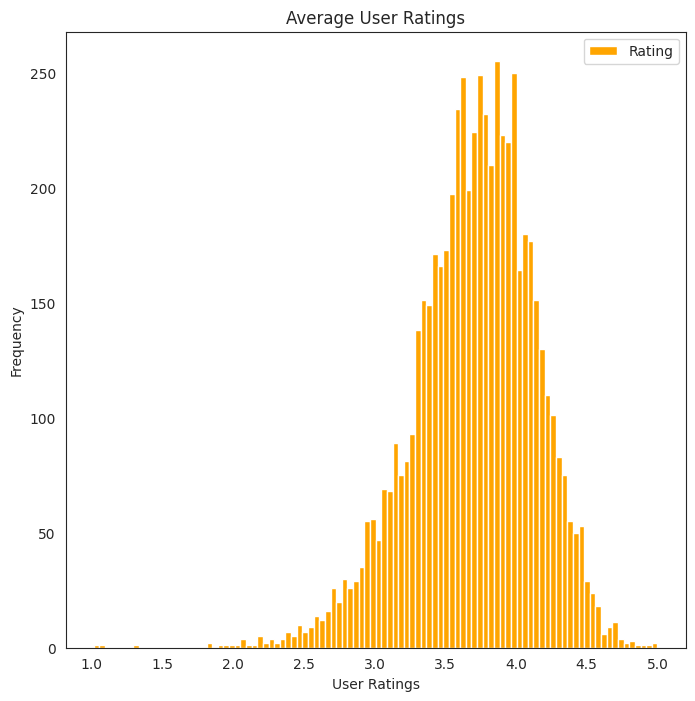

In [66]:
fig = plt.figure(figsize = (8,8))
user_ratings.plot(kind = 'hist', bins = 100, figsize = (8,8), color = 'orange')
plt.plot()
plt.xlabel('User Ratings')
plt.title('Average User Ratings')
plt.ylabel('Frequency')

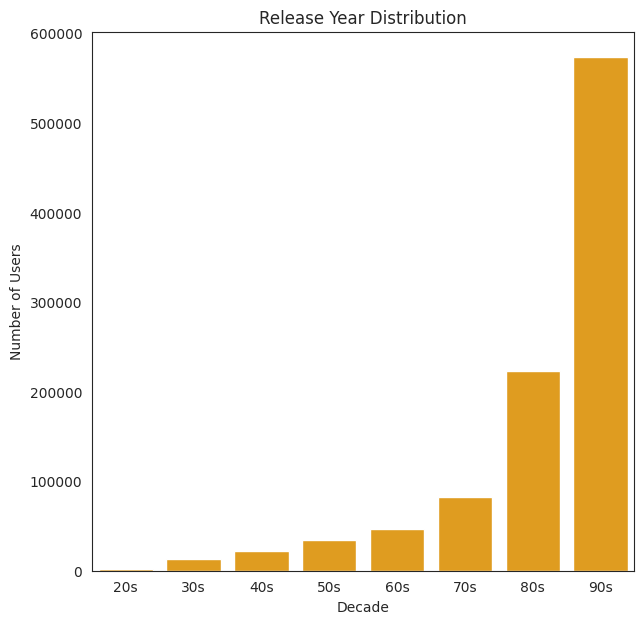

In [68]:
#Number of movies by Release Year:

plt.figure(figsize=(7, 7))
sns.countplot(x='ReleaseDec', data=data, color='orange')
plt.title('Release Year Distribution')
plt.xlabel('Decade')
plt.ylabel('Number of Users')
plt.show()

Insights - Most movies were released in the 90's

In [72]:
#### Top Genres based on movies count

genres_df = pd.get_dummies(dfmov['Genres'].apply(pd.Series).stack()).sum(axis=0)
genres_df

,0
,8
Action,501
Adventure,282
Animation,104
Children's,249
Comedy,1189
Crime,210
Documentary,124
Drama,1582
Fantasy,62


In [76]:
### considering only the genre columns for the test
test = genres_df.iloc[1:]
test

,0
Action,501
Adventure,282
Animation,104
Children's,249
Comedy,1189
Crime,210
Documentary,124
Drama,1582
Fantasy,62
Film-Noir,44


In [77]:
len(test)

18

In [78]:
print(type(pd.to_numeric(test)))
print(type(test.to_numpy().reshape(18,)[0]))
test2 = test.to_numpy().reshape(18,)

<class 'pandas.core.series.Series'>
<class 'numpy.int64'>


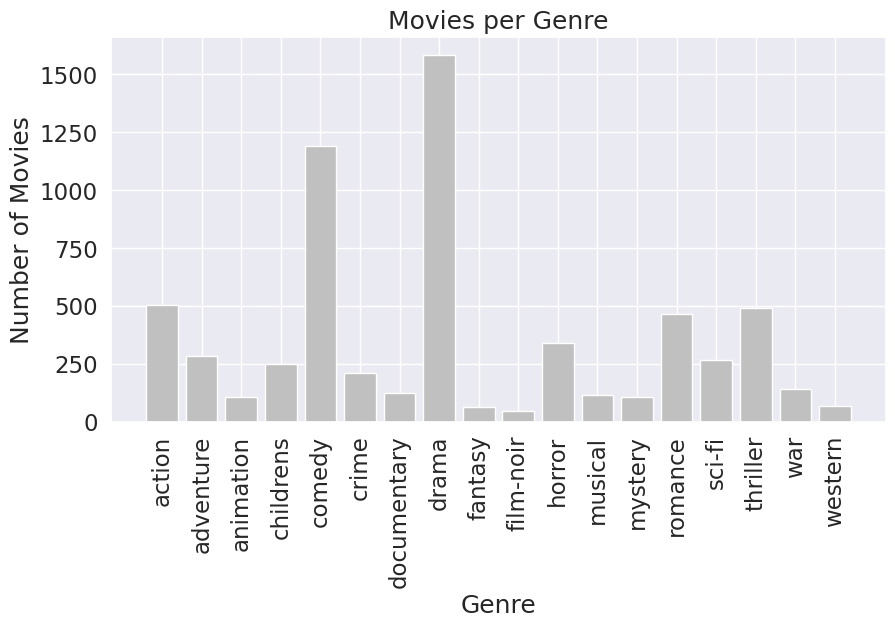

In [80]:
genre_list=['action', 'adventure','animation', 'childrens', 'comedy', 'crime', 'documentary', 'drama','fantasy', 'film-noir', 'horror', 'musical', 'mystery', 'romance', 'sci-fi','thriller', 'war', 'western']
x = np.arange(18)
plt.figure(figsize = (10,5))
plt.bar(x, test2, color = 'silver')
plt.xticks(x, genre_list, rotation = 'vertical')
plt.xlabel('Genre')
plt.ylabel('Number of Movies')
plt.title('Movies per Genre')
sns.set(font_scale=1.5)
plt.show()

Comedy and drama are the most popular genres amongst movies watched and rated by users.

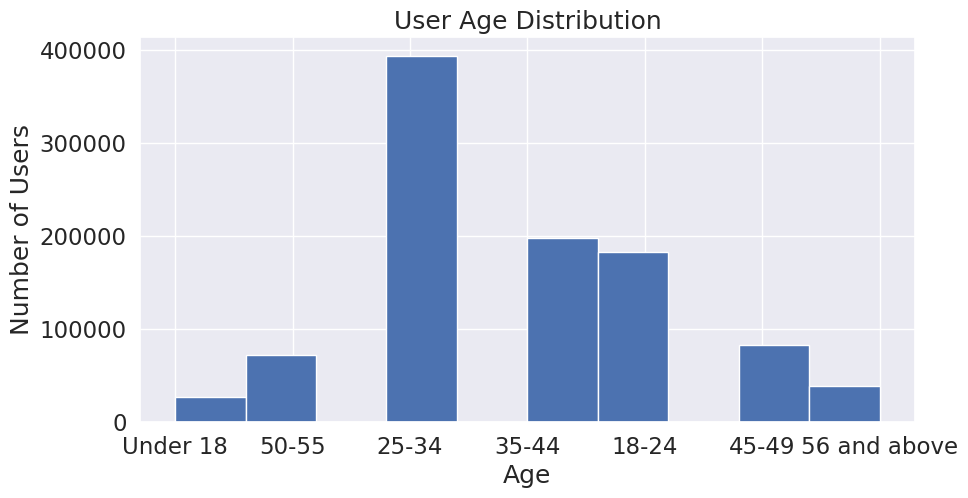

In [82]:
#Distribution of Age

data['Age'].hist(figsize=(10, 5))
plt.title('User Age Distribution')
plt.xlabel('Age')
plt.ylabel('Number of Users')
plt.show()

25-34 Age group people have rated the movies to the maximum.

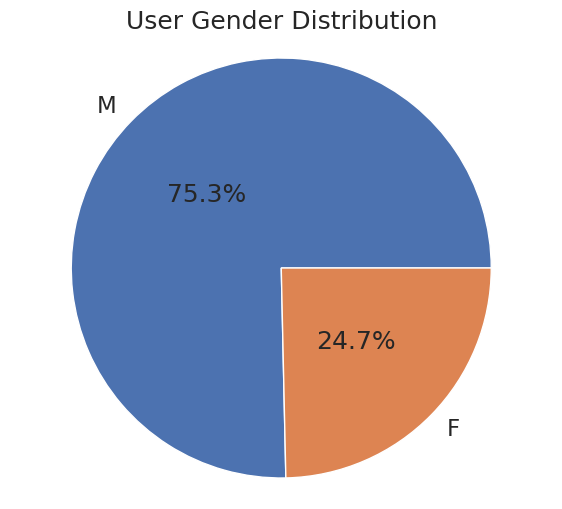

In [83]:
#Distribution by Gender:

x = data['Gender'].value_counts().values
plt.figure(figsize=(7, 6))
plt.pie(x, center=(0, 0), radius=1.5, labels=['M','F'], autopct='%1.1f%%', pctdistance=0.5)
plt.title('User Gender Distribution')
plt.axis('equal')
plt.show()

Most users who have rated the movies are Male

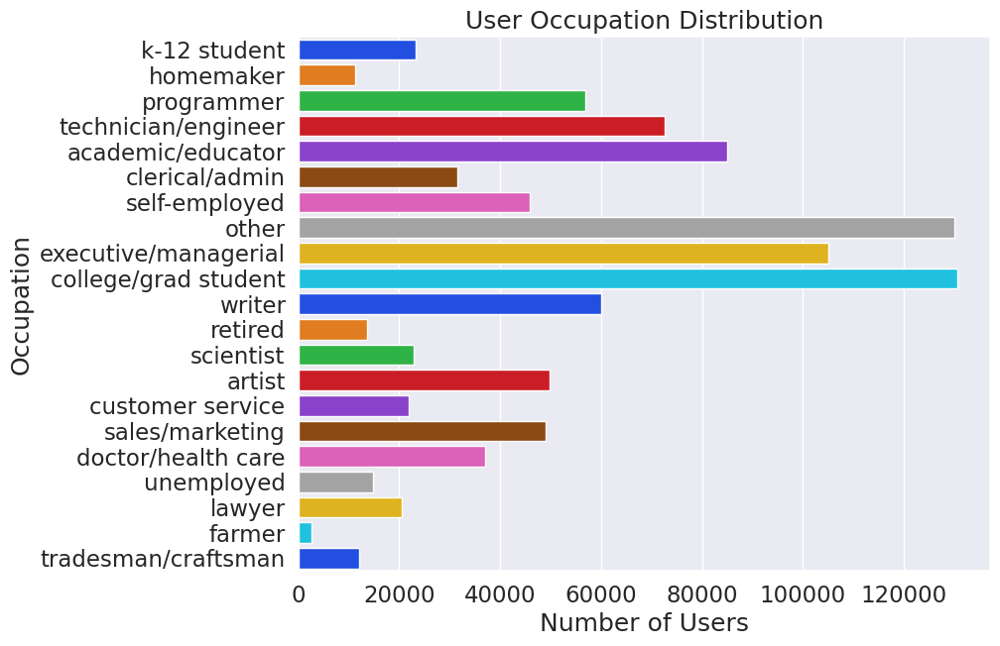

In [86]:
#Distribution by Occupation:

plt.figure(figsize=(9, 7))
sns.countplot(y='Occupation', data=data, palette='bright')
plt.title('User Occupation Distribution')
plt.xlabel('Number of Users')
plt.ylabel('Occupation')
plt.show()

College/ Grad students and Others are the top categories who have rated the movies occupation-wise.

Text(0, 0.5, 'User Rating count')

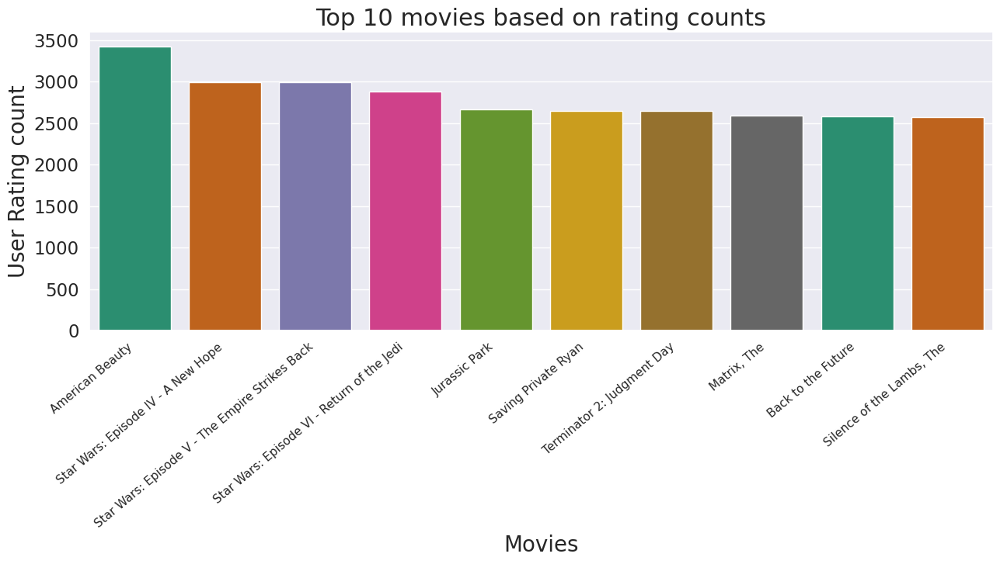

In [87]:
movies_rating_count = data.groupby(by = ['Title'])['Rating'].count().reset_index()[['Title', 'Rating']] ## Counting the ratings based on movies
movies_rating_count.rename(columns = {'Rating': 'totalRatingCount'},inplace=True)

top10_movies=movies_rating_count[['Title', 'totalRatingCount']].sort_values(by = 'totalRatingCount',ascending = False).head(10)

plt.figure(figsize=(15,5))
ax=sns.barplot(x="Title", y="totalRatingCount", data=top10_movies, palette="Dark2")
ax.set_xticklabels(ax.get_xticklabels(), fontsize=11, rotation=40, ha="right")
ax.set_title('Top 10 movies based on rating counts',fontsize = 22)
ax.set_xlabel('Movies',fontsize = 20)
ax.set_ylabel('User Rating count', fontsize = 20)

The movie, American Beauty has got maximum number of ratings by count.

#Recommendation Systems

##User-Interaction Matrix

Creating a pivot table of movie titles and userid and ratings are taken as values.

In [88]:
matrix = pd.pivot_table(data, index='UserID', columns='Title', values='Rating', aggfunc='mean')
matrix.fillna(0, inplace=True) # Imputing 'NaN' values with Zero rating

print(matrix.shape)

matrix.head(10)

(6040, 3640)


Title   $1,000,000 Duck  'Night Mother  'Til There Was You  'burbs, The  \
UserID                                                                    
1                  0.00           0.00                0.00         0.00   
10                 0.00           0.00                0.00         4.00   
100                0.00           0.00                0.00         0.00   
1000               0.00           0.00                0.00         0.00   
1001               0.00           0.00                0.00         0.00   
1002               0.00           0.00                0.00         0.00   
1003               0.00           0.00                0.00         0.00   
1004               0.00           0.00                0.00         0.00   
1005               0.00           0.00                0.00         0.00   
1006               0.00           0.00                0.00         0.00   

Title   ...And Justice for All  1-900  10 Things I Hate About You  \
UserID                                                              
1                         0.00   0.00                        0.00   
10                        0.00   0.00                        0.00   
100                       0.00   0.00                        0.00   
1000                      0.00   0.00                        0.00   
1001                      0.00   0.00                        0.00   
1002                      0.00   0.00                        0.00   
1003                      0.00   0.00                        0.00   
1004                      0.00   0.00                        0.00   
1005                      0.00   0.00                        0.00   
1006                      0.00   0.00                        0.00   

Title   101 Dalmatians  12 Angry Men  13th Warrior, The  187  \
UserID                                                         
1                 0.00          0.00               0.00 0.00   
10                0.00          3.00               4.00 0.00   
100               0.00          0.00               0.00 0.00   
1000              4.00          0.00               0.00 0.00   
1001              3.00          0.00               0.00 0.00   
1002              0.00          0.00               0.00 0.00   
1003              0.00          0.00               0.00 0.00   
1004              4.00          0.00               0.00 0.00   
1005              0.00          0.00               0.00 0.00   
1006              0.00          0.00               0.00 0.00   

Title   2 Days in the Valley  20 Dates  20,000 Leagues Under the Sea  \
UserID                                                                 
1                       0.00      0.00                          0.00   
10                      0.00      0.00                          4.00   
100                     0.00      0.00                          0.00   
1000                    0.00      0.00                          0.00   
1001                    0.00      0.00                          0.00   
1002                    0.00      0.00                          0.00   
1003                    0.00      0.00                          0.00   
1004                    0.00      0.00                          0.00   
1005                    0.00      0.00                          0.00   
1006                    0.00      0.00                          0.00   

Title   200 Cigarettes  2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
UserID                                                                         
1                 0.00                   0.00  0.00                     0.00   
10                0.00                   3.00  0.00                     0.00   
100               0.00                   4.00  0.00                     0.00   
1000              0.00                   0.00  0.00                     0.00   
1001              1.00                   0.00  0.00                     0.00   
1002              0.00                   0.00  0.00                     0.00

In [89]:
# Checking the data sparsity
n_users = data['UserID'].nunique()
n_movies = data['MovieID'].nunique()
sparsity = round(1.0 - data.shape[0] / float( n_users * n_movies), 3)
print('The sparsity level of dataset is ' +  str(sparsity * 100) + '%')

The sparsity level of dataset is 95.5%


##Pearson Correlation

Correlation is a measure that tells how closely two variables move in the same or opposite direction. A positive value indicates that they move in the same direction (i.e. if one increases other increases), where as a negative value indicates the opposite.

The most popular correlation measure for numerical data is Pearson’s Correlation. This measures
the degree of linear relationship between two numeric variables and lies between -1 to +1. It is
represented by ‘r’.

* r=1 means perfect positive correlation
* r=-1 means perfect negative correlation
* r=0 means no linear correlation (note, it does not mean no correlation)


In [91]:
#Item-Based approach

#Taking a movie exmaple to check which 5 other movies are highly correlated with the given movie.

data[data['Title']=='Home Alone']

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,ZipCode,Datetime,ReleaseDec
156020,586,Home Alone,"[Children's, Comedy]",1990,10,3,978228747,F,35-44,academic/educator,95370,2000-12-31 02:12:27,90s
156021,586,Home Alone,"[Children's, Comedy]",1990,11,1,978904356,F,25-34,academic/educator,04093,2001-01-07 21:52:36,90s
156022,586,Home Alone,"[Children's, Comedy]",1990,18,4,978155233,F,18-24,clerical/admin,95825,2000-12-30 05:47:13,90s
156023,586,Home Alone,"[Children's, Comedy]",1990,22,3,978154267,M,18-24,scientist,53706,2000-12-30 05:31:07,90s
156024,586,Home Alone,"[Children's, Comedy]",1990,26,2,978140049,M,25-34,executive/managerial,23112,2000-12-30 01:34:09,90s
...,...,...,...,...,...,...,...,...,...,...,...,...,...
156690,586,Home Alone,"[Children's, Comedy]",1990,5991,3,1000092830,F,35-44,writer,94025,2001-09-10 03:33:50,90s
156691,586,Home Alone,"[Children's, Comedy]",1990,5996,3,966275845,F,25-34,other,87114,2000-08-14 17:57:25,90s
156692,586,Home Alone,"[Children's, Comedy]",1990,6000,3,956884722,M,45-49,technician/engineer,30075,2000-04-28 01:18:42,90s
156693,586,Home Alone,"[Children's, Comedy]",1990,6006,2,957033431,F,Under 18,other,01036,2000-04-29 18:37:11,90s


In [92]:
movie_name='Home Alone'
movie_rating = matrix[movie_name] # Taking the ratings of that movie
print(movie_rating)

UserID
1      0.00
10     3.00
100    0.00
1000   0.00
1001   0.00
       ... 
995    0.00
996    0.00
997    0.00
998    0.00
999    0.00
Name: Home Alone, Length: 6040, dtype: float64


In [93]:
similar_movies = matrix.corrwith(movie_rating) #Finding similar movies

sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True) # Sorting the values based on correlation

sim_df.iloc[1: , :].head() #Top 5 correlated movies.

,Correlation
Title,
Home Alone 2: Lost in New York,0.55
Mrs. Doubtfire,0.47
Liar Liar,0.46
"Mighty Ducks, The",0.45
Sister Act,0.44


##Cosine Similarity

Cosine similarity is a measure of similarity between two sequences of numbers. Those sequences are viewed as vectors in a higher dimensional space, and the cosine similarity is defined as the cosine of the angle between them, i.e. the dot product of the vectors divided by the product of their lengths.

The cosine similarity always belongs to the interval [-1,1]. For example, two proportional vectors have a cosine similarity of 1, two orthogonal vectors have a similarity of 0, and two opposite vectors have a similarity of -1.

In [94]:
item_sim = cosine_similarity(matrix.T) #Finding the similarity values between item-item using cosine_similarity
item_sim

array([[1.        , 0.07235746, 0.03701053, ..., 0.        , 0.12024178,
        0.02700277],
       [0.07235746, 1.        , 0.11528952, ..., 0.        , 0.        ,
        0.07780705],
       [0.03701053, 0.11528952, 1.        , ..., 0.        , 0.04752635,
        0.0632837 ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.04564448],
       [0.12024178, 0.        , 0.04752635, ..., 0.        , 1.        ,
        0.04433508],
       [0.02700277, 0.07780705, 0.0632837 , ..., 0.04564448, 0.04433508,
        1.        ]])

In [95]:
item_sim.shape

(3640, 3640)

###Item-Based Similarity

In [96]:
item_sim_matrix = pd.DataFrame(item_sim, index=matrix.columns, columns=matrix.columns)
item_sim_matrix.head() #Item-similarity Matrix

Title                   $1,000,000 Duck  'Night Mother  'Til There Was You  \
Title                                                                        
$1,000,000 Duck                    1.00           0.07                0.04   
'Night Mother                      0.07           1.00                0.12   
'Til There Was You                 0.04           0.12                1.00   
'burbs, The                        0.08           0.12                0.10   
...And Justice for All             0.06           0.16                0.07   

Title                   'burbs, The  ...And Justice for All  1-900  \
Title                                                                
$1,000,000 Duck                0.08                    0.06   0.00   
'Night Mother                  0.12                    0.16   0.00   
'Til There Was You             0.10                    0.07   0.08   
'burbs, The                    1.00                    0.14   0.00   
...And Justice for All         0.14                    1.00   0.00   

Title                   10 Things I Hate About You  101 Dalmatians  \
Title                                                                
$1,000,000 Duck                               0.06            0.19   
'Night Mother                                 0.08            0.14   
'Til There Was You                            0.13            0.13   
'burbs, The                                   0.19            0.25   
...And Justice for All                        0.08            0.18   

Title                   12 Angry Men  13th Warrior, The  187  \
Title                                                          
$1,000,000 Duck                 0.09               0.06 0.03   
'Night Mother                   0.11               0.05 0.06   
'Til There Was You              0.08               0.07 0.02   
'burbs, The                     0.17               0.20 0.10   
...And Justice for All          0.21               0.12 0.11   

Title                   2 Days in the Valley  20 Dates  \
Title                                                    
$1,000,000 Duck                         0.02      0.02   
'Night Mother                           0.11      0.04   
'Til There Was You                      0.07      0.09   
'burbs, The                             0.18      0.05   
...And Justice for All                  0.20      0.04   

Title                   20,000 Leagues Under the Sea  200 Cigarettes  \
Title                                                                  
$1,000,000 Duck                                 0.14            0.09   
'Night Mother                                   0.07            0.14   
'Til There Was You                              0.03            0.20   
'burbs, The                                     0.19            0.24   
...And Justice for All                          0.17            0.11   

Title                   2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
Title                                                                          
$1,000,000 Duck                          0.07  0.04                     0.00   
'Night Mother                            0.10  0.08                     0.06   
'Til There Was You                       0.06  0.04                     0.00   
'burbs, The                              0.20  0.19                     0.00   
...And Justice for All                   0.22  0.15                     0.08   

Title                   24-hour Woman  28 Days  \
Title                                            
$1,000,000 Duck                  0.00     0.06   
'Night Mother                    0.06     0.06   
'Til There Was You               0.17     0.12   
'burbs, The                      0.04     0.12   
...And Justice for All           0.02     0.09   

Title                   3 Ninjas: High Noon On Mega Mountain  3 Strikes  \
Title                                                                     
$1,000,000 Duck                                 

###User-Based Similarity

In [97]:
user_sim = cosine_similarity(matrix) #Finding the similarity values between user-user using cosine_similarity
user_sim

array([[1.        , 0.25531859, 0.12396703, ..., 0.15926709, 0.11935626,
        0.12239079],
       [0.25531859, 1.        , 0.25964457, ..., 0.16569953, 0.13332665,
        0.24845029],
       [0.12396703, 0.25964457, 1.        , ..., 0.20430203, 0.11352239,
        0.30693676],
       ...,
       [0.15926709, 0.16569953, 0.20430203, ..., 1.        , 0.18657496,
        0.18563871],
       [0.11935626, 0.13332665, 0.11352239, ..., 0.18657496, 1.        ,
        0.10827118],
       [0.12239079, 0.24845029, 0.30693676, ..., 0.18563871, 0.10827118,
        1.        ]])

In [98]:
user_sim_matrix = pd.DataFrame(user_sim, index=matrix.index, columns=matrix.index)
user_sim_matrix.head()

UserID    1   10  100  1000  1001  1002  1003  1004  1005  1006  1007  1008  \
UserID                                                                        
1      1.00 0.26 0.12  0.21  0.14  0.11  0.12  0.18  0.10  0.05  0.06  0.10   
10     0.26 1.00 0.26  0.28  0.16  0.11  0.14  0.43  0.19  0.10  0.16  0.22   
100    0.12 0.26 1.00  0.31  0.08  0.11  0.36  0.24  0.17  0.10  0.06  0.04   
1000   0.21 0.28 0.31  1.00  0.10  0.05  0.20  0.36  0.33  0.13  0.04  0.08   
1001   0.14 0.16 0.08  0.10  1.00  0.16  0.05  0.15  0.14  0.13  0.02  0.08   

UserID  1009  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  \
UserID                                                                          
1       0.05 0.03  0.16  0.08  0.08  0.05  0.20  0.18  0.13  0.15  0.18  0.11   
10      0.12 0.21  0.35  0.20  0.15  0.16  0.16  0.39  0.20  0.29  0.24  0.33   
100     0.06 0.35  0.26  0.14  0.09  0.02  0.30  0.20  0.17  0.15  0.34  0.19   
1000    0.12 0.28  0.25  0.12  0.12  0.05  0.18  0.22  0.09  0.20  0.36  0.20   
1001    0.20 0.07  0.25  0.07  0.04  0.07  0.06  0.30  0.29  0.10  0.07  0.17   

UserID  102  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                         
1      0.12  0.03  0.09  0.12  0.10  0.02  0.03  0.00  0.14  0.05  0.19 0.03   
10     0.16  0.11  0.19  0.11  0.13  0.14  0.08  0.04  0.15  0.08  0.30 0.15   
100    0.01  0.18  0.20  0.07  0.09  0.07  0.07  0.03  0.21  0.10  0.16 0.22   
1000   0.10  0.14  0.17  0.06  0.05  0.02  0.12  0.03  0.15  0.07  0.22 0.17   
1001   0.18  0.15  0.10  0.27  0.05  0.07  0.12  0.13  0.08  0.05  0.16 0.10   

UserID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  1040  \
UserID                                                                          
1       0.05  0.06  0.18  0.03  0.19  0.14  0.14  0.02  0.18  0.03 0.05  0.17   
10      0.24  0.27  0.23  0.20  0.33  0.13  0.17  0.05  0.18  0.06 0.09  0.33   
100     0.40  0.39  0.09  0.14  0.16  0.22  0.19  0.05  0.13  0.00 0.03  0.23   
1000    0.34  0.32  0.14  0.13  0.23  0.13  0.13  0.06  0.09  0.00 0.07  0.23   
1001    0.09  0.08  0.23  0.10  0.15  0.10  0.08  0.20  0.16  0.08 0.13  0.13   

UserID  1041  1042  1043  1044  1045  1046  1047  1048  1049  105  1050  1051  \
UserID                                                                          
1       0.05  0.08  0.08  0.15  0.06  0.03  0.14  0.15  0.07 0.10  0.14  0.25   
10      0.07  0.25  0.10  0.23  0.10  0.13  0.26  0.10  0.11 0.16  0.28  0.46   
100     0.08  0.05  0.09  0.19  0.00  0.09  0.26  0.14  0.18 0.26  0.16  0.21   
1000    0.04  0.05  0.06  0.26  0.04  0.09  0.20  0.05  0.09 0.45  0.14  0.24   
1001    0.08  0.02  0.06  0.02  0.14  0.05  0.14  0.19  0.14 0.05  0.37  0.31   

UserID  1052  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                          
1       0.06  0.05  0.05  0.14  0.06  0.21  0.12  0.21 0.05  0.00  0.18  0.15   
10      0.14  0.19  0.23  0.20  0.14  0.30  0.34  0.34 0.17  0.11  0.16  0.29   
100     0.05  0.27  0.11  0.05  0.04  0.26  0.32  0.21 0.09  0.11  0.05  0.08   
1000    0.02  0.33  0.15  0.11  0.16  0.29  0.28  0.21 0.06  0.10  0.20  0.20   
1001    0.05  0.15  0.13  0.17  0.04  0.17  0.25  0.25 0.07  0.13  0.08  0.12   

UserID  1063  1064  1065  1066  1067  1068  1069  107  1070  1071  1072  1073  \
UserID                                                                          
1       0.10  0.12  0.03  0.10  0.12  0.24  0.03 0.12  0.04  0.07  0.23  0.07   
10      0.25  0.20  0.13  0.28  0.19  0.39  0.12 0.19  0.02  0.19  0.24  0.17   
100     0.26  0.17  0.03  0.20  0.18  0.19  0.10 0.17  0.13  0.19  0.17  0.13   
1000    0.30  0.15  0.01  0.14  0.11  0.18  0.04 0.13  0.04  0.11  0.17  0.09   
1001    0.14  0.24  0.21  0.13  0.17  0.23  0.29 0.04  0.08  0.12  0.15  0.11   

UserID  1074  1075  1076  1077  1078  1079  1

###Nearest Neighbours

In [99]:
model_knn = NearestNeighbors(metric='cosine')
model_knn.fit(matrix.T)

NearestNeighbors(metric='cosine')

In [100]:
##The distances and indices are being calculated with neighbors being 6
distances, indices = model_knn.kneighbors(matrix.T, n_neighbors= 6)

In [101]:
result = pd.DataFrame(indices, columns=['Title1', 'Title2', 'Title3', 'Title4', 'Title5','Title6'])
result.head()
#The result dataframe consits of the different indices of movies based on the distance

,Title1,Title2,Title3,Title4,Title5,Title6
0,0,735,416,286,584,3247
1,1,807,72,2167,3036,3369
2,2,1627,2529,3320,2588,1999
3,3,1457,2169,1308,1047,3511
4,4,26,726,894,495,944


In [102]:
##With this for loop replacing the indices in the result dataframe with movie titles of that corresponding ones
result2 = result.copy()
for i in range(1, 7):
    mov = pd.DataFrame(matrix.T.index).reset_index()
    mov = mov.rename(columns={'index':f'Title{i}'})
    result2 = pd.merge(result2, mov, on=[f'Title{i}'], how='left')
    result2 = result2.drop(f'Title{i}', axis=1)
    result2 = result2.rename(columns={'Title':f'Title{i}'})
result2.head()

,Title1,Title2,Title3,Title4,Title5,Title6
0,"$1,000,000 Duck","Computer Wore Tennis Shoes, The",Blackbeard's Ghost,"Barefoot Executive, The",Candleshoe,That Darn Cat!
1,'Night Mother,"Cry in the Dark, A",Agnes of God,Mommie Dearest,Sophie's Choice,"Trip to Bountiful, The"
2,'Til There Was You,If Lucy Fell,Picture Perfect,To Gillian on Her 37th Birthday,Practical Magic,Mad Love
3,"'burbs, The",Harry and the Hendersons,"Money Pit, The",Ghostbusters II,European Vacation,Weekend at Bernie's
4,...And Justice for All,52 Pick-Up,Coma,Deliverance,"Boys from Brazil, The",Dog Day Afternoon


In [103]:
movie_name = 'Liar Liar'
result2.loc[result2['Title1']==movie_name] #5 nearest movies for the movie present in Title1.

,Title1,Title2,Title3,Title4,Title5,Title6
1887,Liar Liar,Mrs. Doubtfire,Ace Ventura: Pet Detective,Dumb & Dumber,Home Alone,Wayne's World


###Matrix Factorization

In [104]:
rm = data.pivot(index = 'UserID', columns ='MovieID', values = 'Rating').fillna(0)
rm.head()

MovieID    1   10  100  1000  1002  1003  1004  1005  1006  1007  1008  1009  \
UserID                                                                         
1       5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
10      5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  5.00   
100     0.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
1000    5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
1001    4.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   

MovieID  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  102  \
UserID                                                                          
1       0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
10      0.00  0.00  0.00  3.00  0.00  0.00  3.00  5.00  0.00  0.00  4.00 0.00   
100     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000    0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1001    0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                     
1        0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00  5.00  5.00 0.00   
10       3.00  0.00  5.00  5.00  0.00  4.00  0.00  0.00  5.00  0.00 0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000     0.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00  3.00 0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00 0.00   
10       3.00  4.00  4.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00 3.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  4.00  0.00  0.00  0.00 0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1040  1041  1042  1043  1044  1046  1047  1049  105  1050  1051  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
10       0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  2.00 0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   

MovieID  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
10       0.00  0.00  0.00  0.00  0.00  0.00  5.00 0.00  0.00  0.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  2.00 0.00  0.00  0.00  0.00   

MovieID  1063  1064  1066  1067  1068  1069  107  1070  1071  1073  1076  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
10       0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  5.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
1001     2.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   

MovieID  1077  1078  1079  108  1080  1081  1082  1083  1084  1085  1086  \
UserID                                                                     
1        0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00

-Using Cmfrec library -->

In [105]:
user_itm = data[['UserID', 'MovieID', 'Rating']].copy()
user_itm.columns = ['UserId', 'ItemId', 'Rating']  # Lib requires specific column names
user_itm.head(2)

,UserId,ItemId,Rating
0,1,1,5
1,6,1,4


In [106]:
print(user_itm.shape)
print("No.of Users:",len(user_itm['UserId'].unique()))
print("No.of Items:",len(user_itm['ItemId'].unique()))

(996144, 3)
No.of Users: 6040
No.of Items: 3682


In [109]:
!pip install cmfrec
from cmfrec import CMF

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.3/268.3 kB 4.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached findblas-0.1.26.post1-py3-none-any.whl
  Created wheel for cmfrec: filename=cmfrec-3.5.1.post10-cp310-cp310-linux_x86_64.whl size=5669728 sha256=fa8188fef2f673a080518b250dfdf1f648e2cbd0c11165dd6cc9cf0605d28272
  Stored in directory: /root/.cache/pip/wheels/cc/80/d7/9b7d9361970eb499c0227a3fac504240f7793dec0d9793bee6
Successfully built cmfrec


In [110]:
model = CMF(method="als", k=4, lambda_=0.1, user_bias=False, item_bias=False, verbose=False)
model.fit(user_itm) #Fitting the model

Collective matrix factorization model
(explicit-feedback variant)


In [111]:
model.A_.shape, model.B_.shape #model.A_ gives the embeddings of Users and model.B_ gives the embeddings of Items.

((6040, 4), (3682, 4))

In [112]:
user_itm.Rating.mean(), model.glob_mean_  # Average rating and Global Mean

(3.57998542379415, 3.5799853801727295)

In [113]:
rm__ = np.dot(model.A_, model.B_.T) + model.glob_mean_ #Calculating the predicted ratings
rmse = mean_squared_error(rm.values[rm > 0], rm__[rm > 0], squared=False) # calculating rmse value
print('Root Mean Squared Error: {:.3f}'.format(rmse))
mape =  mean_absolute_percentage_error(rm.values[rm > 0], rm__[rm > 0]) #calculating mape value
print('Mean Absolute Percentage Error: {:.3f}'.format(mape))

Root Mean Squared Error: 1.468
Mean Absolute Percentage Error: 0.421


Embeddings for User-user similarity

In [114]:
user=cosine_similarity(model.A_)

user_sim_matrix = pd.DataFrame(user, index=matrix.index, columns=matrix.index)
user_sim_matrix.head()  #User similarity matrix using the embeddings from matrix factorization

UserID     1    10   100  1000  1001  1002  1003  1004  1005  1006  1007  \
UserID                                                                     
1       1.00 -0.09  0.36 -0.25  0.72  0.33 -0.01 -0.63 -0.45 -0.57 -0.46   
10     -0.09  1.00 -0.51  0.06  0.58  0.33  0.15 -0.57  0.04  0.78  0.29   
100     0.36 -0.51  1.00  0.66 -0.07  0.49  0.66  0.44  0.45 -0.26  0.13   
1000   -0.25  0.06  0.66  1.00 -0.20  0.54  0.92  0.58  0.89  0.53  0.57   
1001    0.72  0.58 -0.07 -0.20  1.00  0.60 -0.02 -0.88 -0.45  0.05 -0.00   

UserID  1008  1009   101  1010  1011  1012  1013  1014  1015  1016  1017  \
UserID                                                                     
1       0.42  0.84 -0.03  0.05 -0.49 -0.46  0.10  0.76  0.13 -0.13  0.62   
10      0.37 -0.24  0.83  0.90  0.84  0.54  0.11  0.45  0.50  0.96  0.64   
100     0.59  0.77 -0.01 -0.19 -0.33  0.17  0.43  0.32  0.24 -0.31  0.10   
1000    0.69  0.24  0.51  0.27  0.42  0.84  0.47  0.17  0.47  0.32  0.14   
1001    0.50  0.53  0.56  0.69  0.21 -0.01  0.34  0.91  0.58  0.49  0.84   

UserID  1018  1019   102  1020  1021  1022  1023  1024  1025  1026  1027  \
UserID                                                                     
1      -0.32  0.08  0.60  0.54 -0.34  0.31 -0.16 -0.48 -0.45 -0.45  0.82   
10     -0.19 -0.40  0.12 -0.34  0.02  0.57 -0.31  0.78  0.79  0.27 -0.41   
100     0.14  0.90  0.14  0.93  0.28  0.41  0.81 -0.16 -0.19  0.32  0.70   
1000    0.19  0.76 -0.08  0.55  0.50  0.66  0.91  0.60  0.54  0.87  0.10   
1001   -0.14 -0.13  0.35  0.25 -0.06  0.58 -0.41  0.12  0.21 -0.30  0.27   

UserID  1028  1029   103  1030  1031  1032  1033  1034  1035  1036  1037  \
UserID                                                                     
1       0.14 -0.27 -0.12 -0.03 -0.04  0.67 -0.18 -0.68  0.51 -0.08 -0.70   
10     -0.30  0.37  0.02  0.75  0.65 -0.64  0.46  0.02  0.19  0.62 -0.27   
100     0.44 -0.02  0.73  0.16 -0.10  0.74  0.42  0.15  0.72 -0.03 -0.07   
1000    0.19  0.31  0.99  0.68  0.36  0.03  0.91  0.59  0.67  0.36  0.15   
1001    0.13  0.24 -0.14  0.44  0.20  0.20  0.14 -0.39  0.52  0.50 -0.56   

UserID  1038  1039   104  1040  1041  1042  1043  1044  1045  1046  1047  \
UserID                                                                     
1       0.21 -0.66 -0.08 -0.16  0.32  0.47  0.47  0.23  0.00  0.78  0.05   
10     -0.20  0.24  0.45  0.51  0.84 -0.12  0.32 -0.35 -0.58  0.48 -0.18   
100     0.93  0.02  0.33  0.35 -0.05  0.71  0.34  0.93  0.87 -0.02  0.72   
1000    0.86  0.55  0.69  0.86  0.28  0.44  0.27  0.74  0.72 -0.24  0.68   
1001    0.02 -0.22  0.35  0.12  0.73  0.43  0.74  0.01 -0.48  0.99  0.05   

UserID  1048  1049   105  1050  1051  1052  1053  1054  1055  1056  1057  \
UserID                                                                     
1       0.78 -0.73  0.04  0.00 -0.27  0.09 -0.05 -0.04  0.17  0.78  0.52   
10      0.01  0.26 -0.26  0.49  0.06 -0.10 -0.51  0.28  0.52 -0.46 -0.54   
100     0.73  0.12  0.86  0.33  0.41  0.42  0.91  0.59  0.09  0.86  0.63   
1000    0.40  0.79  0.89  0.74  0.65  0.31  0.82  0.93  0.27  0.27  0.04   
1001    0.58 -0.47 -0.24  0.17 -0.00  0.22 -0.41  0.06  0.65  0.28  0.21   

UserID  1058  1059  106  1060  1061  1062  1063  1064  1065  1066  1067  1068  \
UserID                                                                          
1      -0.27 -0.12 0.63  0.56  0.44 -0.09 -0.00  0.44 -0.33  0.73  0.31 -0.17   
10     -0.02  0.13 0.31 -0.40  0.09  0.50  0.68  0.81 -0.19  0.52 -0.15  0.38   
100     0.68  0.68 0.22  0.70  0.80  0.38  0.19 -0.31  0.62  0.10  0.54  0.29   
1000    0.97  0.97 0.11  0.20  0.74  0.85  0.68 -0.13  0.81  0.01  0.30  0.75   
1001   -0.21  0.00 0.53  0.33  0.40  0.17  0.35  0.79 -0.28  0.82  0.35 -0.05   

UserID  1069   107  1070  1071  1072  1073  1074  1075  1076  1077  1078  \
UserID                                                                     
1      -0.50 -0.48  0.85  0.68 -0.39 -0.31 -0.16 -0.12 -0.34  0.74  0.90   
10    

In [115]:
itm=cosine_similarity(model.B_)

itm_sim_matrix = pd.DataFrame(itm, index=user_itm['ItemId'].unique(), columns=user_itm['ItemId'].unique())
itm_sim_matrix.head()#Item similarity matrix using the embeddings from matrix factorization

1    2     3     4    5     6    7    8     9   10   11    12   13   14  \
1  1.00 0.26 -0.06 -0.14 0.04  0.68 0.30 0.07 -0.30 0.50 0.81 -0.53 0.33 0.32   
2  0.26 1.00  0.93  0.82 0.95  0.15 0.95 0.95  0.78 0.77 0.72  0.66 0.92 0.42   
3 -0.06 0.93  1.00  0.78 0.97 -0.00 0.89 0.89  0.94 0.73 0.51  0.81 0.74 0.14   
4 -0.14 0.82  0.78  1.00 0.84 -0.28 0.73 0.95  0.71 0.29 0.27  0.88 0.89 0.62   
5  0.04 0.95  0.97  0.84 1.00 -0.11 0.96 0.92  0.83 0.67 0.60  0.77 0.83 0.24   

     15    16   17    18    19    20   21   22    23   24    25   26    27  \
1 -0.22  0.43 0.79 -0.21 -0.51 -0.33 0.67 0.39 -0.30 0.19  0.26 0.76 -0.05   
2  0.88  0.07 0.39  0.29  0.57  0.80 0.38 0.87  0.77 0.99 -0.01 0.71  0.89   
3  0.98  0.00 0.02  0.46  0.81  0.95 0.10 0.85  0.94 0.95 -0.14 0.40  0.99   
4  0.86 -0.29 0.32  0.09  0.58  0.79 0.21 0.46  0.67 0.81 -0.07 0.51  0.69   
5  0.95 -0.17 0.19  0.23  0.65  0.87 0.08 0.80  0.83 0.93 -0.28 0.55  0.95   

     28    29    30   31    32    33    34    35    36    37    38   39   40  \
1  0.69  0.31  0.05 0.16  0.59 -0.19  0.83 -0.22  0.85  0.38 -0.51 0.75 0.22   
2  0.32 -0.07  0.15 0.93 -0.03  0.84  0.30  0.39  0.17  0.48  0.64 0.58 0.36   
3 -0.05 -0.25 -0.04 0.96 -0.22  0.94 -0.08  0.32 -0.19  0.52  0.84 0.23 0.09   
4  0.34 -0.06  0.44 0.67 -0.29  0.78  0.20  0.72  0.00 -0.02  0.76 0.45 0.65   
5  0.12 -0.34 -0.04 0.96 -0.32  0.85  0.07  0.29 -0.12  0.52  0.83 0.33 0.25   

     41    42   43    44    45    46    47    48    49    50   52    53    54  \
1  0.56 -0.26 0.35 -0.46  0.02 -0.06  0.73 -0.06  0.65  0.82 0.57  0.57 -0.24   
2  0.08  0.61 0.75  0.64  0.16  0.93  0.06  0.91  0.24 -0.19 0.32 -0.37  0.85   
3 -0.25  0.66 0.55  0.85  0.01  0.93 -0.09  0.89  0.10 -0.42 0.11 -0.68  0.89   
4  0.14  0.71 0.73  0.63  0.40  0.95 -0.41  0.96 -0.20 -0.60 0.10 -0.32  0.97   
5 -0.19  0.53 0.55  0.71 -0.04  0.96 -0.18  0.95 -0.02 -0.43 0.03 -0.60  0.91   

     55    56   57    58   59   60    61   62    64    65    66   67   68  \
1 -0.15 -0.48 0.35  0.80 0.36 0.17 -0.18 0.77 -0.53 -0.63 -0.75 0.36 0.19   
2  0.58  0.71 0.48  0.23 0.56 0.82  0.84 0.78  0.68  0.54  0.41 0.87 0.53   
3  0.48  0.85 0.33 -0.14 0.28 0.65  0.97 0.59  0.85  0.75  0.63 0.68 0.29   
4  0.91  0.88 0.36  0.14 0.72 0.94  0.72 0.33  0.84  0.72  0.72 0.83 0.77   
5  0.55  0.84 0.23 -0.03 0.46 0.75  0.95 0.64  0.81  0.64  0.55 0.72 0.40   

     69    70    71    72   73   74    75    76   77   78    79    80    81  \
1  0.23 -0.19 -0.51 -0.08 0.87 0.10 -0.06 -0.44 0.46 0.12 -0.28  0.10 -0.07   
2  0.30  0.44  0.67  0.04 0.64 0.98  0.91  0.56 0.30 0.42  0.85 -0.05  0.35   
3  0.32  0.59  0.88  0.04 0.31 0.98  0.95  0.69 0.05 0.19  0.96 -0.21  0.40   
4 -0.04  0.29  0.75  0.08 0.36 0.82  0.85  0.69 0.27 0.73  0.87  0.13  0.26   
5  0.12  0.37  0.78 -0.15 0.43 0.99  0.99  0.55 0.02 0.31  0.93 -0.28  0.20   

     82    83    84    85   86    87    88    89   90    92    93   94    95  \
1  0.53  0.74 -0.26 -0.03 0.43 -0.55 -0.41 -0.06 0.90 -0.44 -0.43 0.72 -0.13   
2  0.31  0.26  0.81  0.42 0.93  0.60  0.57  0.90 0.60  0.67  0.73 0.39  0.88   
3 -0.02  0.07  0.83  0.33 0.86  0.71  0.81  0.95 0.29  0.78  0.84 0.11  0.99   
4  0.38 -0.15  0.98  0.56 0.56  0.90  0.47  0.80 0.26  0.85  0.90 0.16  0.74   
5  0.06 -0.01  0.87  0.24 0.83  0.72  0.64  0.87 0.37  0.70  0.80 0.09  0.93   

     96    97    98   99  100   101   102  103   104  105   106  107   108  \
1 -0.11 -0.13 -0.29 0.18 0.06  0.18 -0.51 0.16  0.09 0.11  0.55 0.27 -0.15   
2 -0.08 -0.15  0.78 0.36 0.84 -0.14  0.60 0.98  0.39 0.88  0.13 0.93 -0.04   
3 -0.26 -0.16  0.80 0.17 0.86 -0.24  0.70 0.95  0.53 0.76 -0.22 0.78  0.11   
4  0.39 -0.02  0.98 0.50 0.68 -0.16  0.88 0.83 -0.02 0.97  0.26 0.91 -0.21   
5 -0.15 -0.33  0.82 0.14 0.75 -0.38  0.65 0.94  0.33 0.85 -0.09 0.84 -0.14   

    110   111  112   113   114   116   117   118   119  120   121   122   123  \
1  0.81  0.51 0.54 -0.13 -0.10  0.73 -0.07 -0.06 -0.29 0.02  0.90 -0.26  0.51   
2  0.18 -0.25 0.86  0.84  0.67  

In [116]:
#Taking an example:

movie_name='586'
movie_rating = itm_sim_matrix[movie_name] # Taking the ratings of that movie
print(movie_rating)

1       0.25
2       0.96
3       0.94
4       0.70
5       0.97
        ... 
3948    0.53
3949   -0.38
3950    0.44
3951    0.11
3952    0.45
Name: 586, Length: 3682, dtype: float32


In [117]:
similar_movies = itm_sim_matrix.corrwith(movie_rating) #Finding similar movies

sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True) # Sorting the values based on correlation

sim_df.iloc[1: , :].head() #Top 5 correlated movies.

,Correlation
2875,1.00
3482,1.00
3565,1.00
3594,1.00
653,1.00


In [118]:
item_mov = data[['MovieID', 'Title']].copy()
item_mov.drop_duplicates(inplace=True)
item_mov.reset_index(drop=True,inplace=True)

sim_df1= sim_df.copy()
sim_df1.reset_index(inplace=True)
sim_df1.rename(columns = {'index':'MovieID'}, inplace = True)
sim_mov = pd.merge(sim_df1,item_mov,on='MovieID',how='inner')
sim_mov.head(6)

,MovieID,Correlation,Title
0,586,1.00,Home Alone
1,2875,1.00,Sommersby
2,3482,1.00,Price of Glory
3,3565,1.00,Where the Heart Is
4,3594,1.00,Center Stage
5,653,1.00,Dragonheart


In [119]:
model1 = CMF(method="als", k=2, lambda_=0.1, user_bias=False, item_bias=False, verbose=False)
model1.fit(user_itm)

Collective matrix factorization model
(explicit-feedback variant)


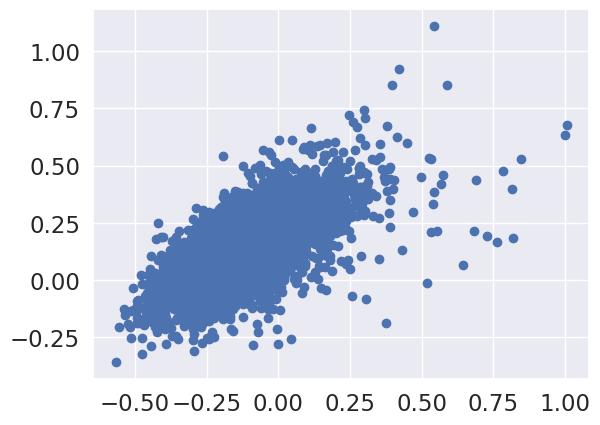

In [120]:
plt.scatter(model1.A_[:, 0], model1.A_[:, 1], cmap = 'hot')

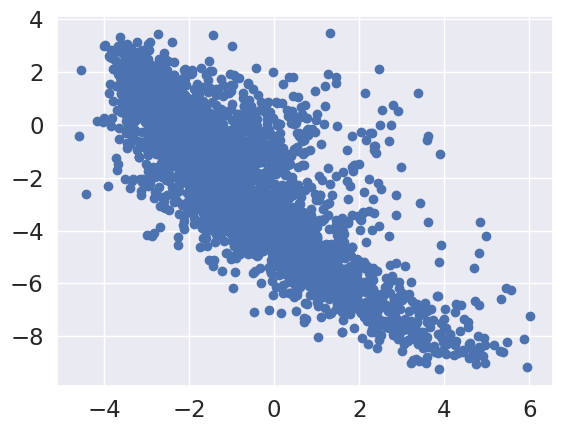

In [121]:
plt.scatter(model1.B_[:, 0], model1.B_[:, 1], cmap='hot')

1. Users of which age group have watched and rated the most number of movies? :- **25-34 age group**

2. Users belonging to which profession have watched and rated the most movies? :- **college/grad student**

3. Most of the users in our dataset who’ve rated the movies are Male. (T/F):- **True**

4. Most of the movies present on our dataset were released in which decade? :     a.70s		b. 90s		c. 50s		d.80s-
    **b.90s**


5. The movie with maximum no. of ratings is ___ :- **American Beauty**

6. Name the top 3 movies similar to ‘Liar Liar’ on the item-based approach. :- **Mrs. Doubtfire, Ace Ventura: Pet, Detective Dumb & Dumber**

7. On the basis of approach, Collaborative Filtering methods can be classified into **Memory-based** and **Model-based**.

8. Pearson Correlation ranges between **-1 to 1** whereas, Cosine Similarity belongs to the interval between **0 to 1**

9. Mention the RMSE and MAPE that you got while evaluating the Matrix Factorization model.:- **RMSE:0.701  and MAPE: 0.54**

10. Give the sparse ‘row’ matrix representation for the following dense matrix - [[1 0],[ 3 7]]

In [135]:
from scipy.sparse import csr_matrix
# create dense matrix
A = np.array([[1,0],[3,7]])
# convert to sparse matrix (CSR method)
S = csr_matrix(A)
print(S)

  (0, 0)	1
  (1, 0)	3
  (1, 1)	7
